In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import fsolve
from scipy.stats import norm
import seaborn as sns

# a. (20%) Using the yield curve at the purchasing date of the bond, calculate the spread the bank used to obtain the bond price.

In [10]:
dt_bond  = pd.read_excel('Dataset2020.xlsx', sheet_name='2020')

In [19]:
dt_yc  = pd.read_excel('Dataset2020.xlsx', sheet_name='YieldCurves')
dt_yc.head()

,Nr,Date,025YR,050YR,075YR,100YR,125YR,150YR,175YR,200YR,...,2775YR,2800YR,2825YR,2850YR,2875YR,2900YR,2925YR,2950YR,2975YR,3000YR
0,1,1991-01-02,0.109902,0.107580,0.106003,0.104871,0.104052,0.103452,0.103003,0.102650,...,0.106174,0.106936,0.107745,0.108603,0.109513,0.110480,0.111507,0.112599,0.113762,0.115003
1,2,1991-01-03,0.110730,0.106979,0.104925,0.103583,0.102676,0.102060,0.101638,0.101343,...,0.105752,0.106534,0.107363,0.108242,0.109173,0.110160,0.111207,0.112320,0.113505,0.114767
2,3,1991-01-04,0.109696,0.105784,0.103779,0.102526,0.101709,0.101168,0.100805,0.100552,...,0.106577,0.107330,0.108133,0.108987,0.109898,0.110869,0.111905,0.113012,0.114197,0.115466
3,4,1991-01-07,0.108183,0.105584,0.104109,0.103155,0.102524,0.102102,0.101814,0.101605,...,0.108158,0.108934,0.109766,0.110655,0.111607,0.112627,0.113721,0.114896,0.116160,0.117523
4,5,1991-01-08,0.107085,0.104627,0.103522,0.102875,0.102463,0.102184,0.101982,0.101818,...,0.108374,0.109147,0.109975,0.110862,0.111812,0.112830,0.113923,0.115097,0.116362,0.117726


In [20]:
def gen_mon_yc(dt_q, rf):

    '''
    A function to create monthly yield curves from quarterly yield curves based on interpolation.

    '''

    test_date = pd.date_range(start="01/1901",end="01/1931",freq="Q")
    yc = []

    for i in range(len(dt_q)):
        yc1 = pd.DataFrame({'date' : test_date, 'yield' : dt_q.iloc[i][2:]})
        yc1['yield'] = yc1['yield'].astype(float)
        yc.append(yc1.set_index('date').resample('M').interpolate()['yield'])

    yc = pd.DataFrame(yc)
    
    yc['Date'] = list(dt_q['Date'])
    yc.insert(loc=0, column='1901-01-31', value=rf)
    yc.insert(loc=1, column='1901-02-28', value=rf)
    cols = yc.columns.tolist()
    cols = cols[-1:] + cols[:-1]
    yc = yc[cols]

    return yc

In [21]:
# Assume any risk-free rate for a period shorter than 120 days equals the 120-day risk-free rates.
rf = dt_yc.loc[:, [' 025YR']]
rf = list(rf[' 025YR'])

In [22]:
dt_yc_m = gen_mon_yc(dt_yc, rf)

In [23]:
dt_yc_m.head()

date,Date,1901-01-31,1901-02-28,1901-03-31 00:00:00,1901-04-30 00:00:00,1901-05-31 00:00:00,1901-06-30 00:00:00,1901-07-31 00:00:00,1901-08-31 00:00:00,1901-09-30 00:00:00,...,1930-03-31 00:00:00,1930-04-30 00:00:00,1930-05-31 00:00:00,1930-06-30 00:00:00,1930-07-31 00:00:00,1930-08-31 00:00:00,1930-09-30 00:00:00,1930-10-31 00:00:00,1930-11-30 00:00:00,1930-12-31 00:00:00
yield,1991-01-02,0.109902,0.109902,0.109902,0.109128,0.108354,0.107580,0.107054,0.106528,0.106003,...,0.111507,0.111871,0.112235,0.112599,0.112986,0.113374,0.113762,0.114175,0.114589,0.115003
yield,1991-01-03,0.110730,0.110730,0.110730,0.109480,0.108229,0.106979,0.106294,0.105609,0.104925,...,0.111207,0.111578,0.111949,0.112320,0.112715,0.113110,0.113505,0.113925,0.114346,0.114767
yield,1991-01-04,0.109696,0.109696,0.109696,0.108392,0.107088,0.105784,0.105116,0.104447,0.103779,...,0.111905,0.112274,0.112643,0.113012,0.113407,0.113802,0.114197,0.114620,0.115043,0.115466
yield,1991-01-07,0.108183,0.108183,0.108183,0.107317,0.106451,0.105584,0.105093,0.104601,0.104109,...,0.113721,0.114112,0.114504,0.114896,0.115317,0.115738,0.116160,0.116614,0.117068,0.117523
yield,1991-01-08,0.107085,0.107085,0.107085,0.106266,0.105446,0.104627,0.104259,0.103890,0.103522,...,0.113923,0.114314,0.114706,0.115097,0.115519,0.115940,0.116362,0.116817,0.117271,0.117726


In [24]:
dt_bond['Life'] = dt_bond['CurrentCoupon'] + dt_bond['CouponsRemaining']

dt_bond.loc[dt_bond['PaymentPeriod'] == 'Annually', 'LastPMTdate'] = pd.Timestamp('2019-12-31') # Assume the last pay day of Anually bond is at 12312019.
dt_bond.loc[dt_bond['PaymentPeriod'] == 'Quarterly', 'LastPMTdate'] = pd.Timestamp('2020-06-30') # Assume the last pay day of Quarterly bond is at 06302020.
dt_bond.loc[dt_bond['PaymentPeriod'] == 'Monthly', 'LastPMTdate'] = pd.Timestamp('2020-07-31') # Assume the last pay day of Monthly bond is at 07312020.
dt_bond['AccrualDays'] = (pd.Timestamp('2020-08-26') - dt_bond['LastPMTdate'])

dt_bond.describe()

,id,PriceAtCoupon0(%),CurrentCoupon,CouponsRemaining,BondsHeld,YearlyRate,FaceValue,Life,AccrualDays
count,175680.000000,175680.000000,175680.000000,175680.000000,175680.000000,175680.000000,1.756800e+05,175680.000000,175680
mean,88980.339361,73.732044,115.705840,199.209751,268.923463,0.096023,1.056944e+05,314.915591,93 days 04:09:00.000000002
std,51372.020786,8.799464,109.852351,183.794964,777.096158,0.034733,1.889300e+04,253.518962,96 days 01:51:44.534254764
min,1.000000,29.000000,0.000000,1.000000,1.000000,0.037334,4.700000e+04,1.000000,26 days 00:00:00
25%,44486.750000,69.500000,19.000000,46.000000,10.000000,0.069502,9.700000e+04,84.000000,26 days 00:00:00
50%,88984.000000,72.410000,77.000000,104.000000,25.000000,0.088901,1.020000e+05,268.000000,26 days 00:00:00
75%,133461.250000,77.276250,205.000000,351.000000,100.000000,0.110931,1.090000e+05,527.000000,239 days 00:00:00
max,177957.000000,136.276000,355.000000,600.000000,5000.000000,0.265953,1.145000e+06,954.000000,239 days 00:00:00


In [25]:
def pricing_func2(couponr, frequency, facevalue, series, maturity, spread, AD):

    '''
    The bond pricing function, mapping every cash flow to its maturity on the yield curve.
    '''
    
    if frequency == 'Monthly':
        if maturity <= len(series):
            ret = sum([(couponr * facevalue / 12)/((1 + (series[i] + spread) / 12) ** (i + 1)) for i in range(maturity)])

        else:
            series.extend((maturity - len(series)) * [series[-1]])
            ret = sum([(couponr * facevalue / 12)/((1 + (series[i] + spread) / 12) ** (i + 1)) for i in range(maturity)])
        ret += facevalue / (1 + (series[maturity - 1] + spread) / 12) ** (maturity) 
        return ret - couponr * facevalue / 12 * AD.days / 30

    elif frequency == 'Quarterly':
        series = series[2::3] # every 3 month of a monthly curve is a quarterly curve.
        if maturity <= len(series):
            ret = sum([(couponr * facevalue * 0.25)/((1 + (series[i] + spread) / 4) ** (i + 1)) for i in range(maturity)])

        else:
            series.extend((maturity - len(series)) * [series[-1]])
            ret = sum([(couponr * facevalue * 0.25)/((1 + (series[i] + spread) / 4) ** (i + 1)) for i in range(maturity)])
        ret += facevalue / (1 + (series[maturity - 1] + spread) / 4) ** (maturity)
        return ret - couponr * facevalue * 0.25 * AD.days / 120

    elif frequency == 'Annually':
        series = series[11::12] # every 12 month of a monthly curve is a annually curve.
        if maturity <= len(series):
            ret = sum([(couponr * facevalue)/((1 + series[i] + spread) ** (i + 1)) for i in range(maturity)])

        else:
            series.extend((maturity - len(series)) * [series[-1]])
            ret = sum([(couponr * facevalue)/((1 + series[i] + spread) ** (i + 1)) for i in range(maturity)])
            
        ret += facevalue / (1 + series[maturity - 1] + spread) ** (maturity)
        return ret - couponr * facevalue * AD.days / 365

    

In [27]:
pricing_func2(0.5, 'Quarterly', 10000, pd.Series.tolist(dt_yc_m.loc[dt_yc_m['Date'] == '20200826'])[0][1:], 121, 0.05, pd.Timedelta('57 days'))

71433.54825992239

In [28]:
def equa(spread, cr, frequency, facevalue, series, maturity, pv, AD):

    '''
    The equation with the bond-pricing function built in for the convenienve of fsolve.
    '''

    return pricing_func2(cr, frequency, facevalue, series[0][2:], maturity, spread, AD) - pv/100 * facevalue

In [30]:
res = [fsolve(equa, x0 = 0, args=(dt_bond.iloc[rindex]['YearlyRate'], 
                                    dt_bond.iloc[rindex]['PaymentPeriod'], 
                                    dt_bond.iloc[rindex]['FaceValue'], 
                                    pd.Series.tolist(dt_yc_m.loc[dt_yc_m['Date'] == dt_bond.iloc[rindex]['PurchaseDate']]), 
                                    dt_bond.iloc[rindex]['Life'], 
                                    dt_bond.iloc[rindex]['PriceAtCoupon0(%)'], 
                                    dt_bond.iloc[rindex]['AccrualDays']))[0] for rindex in range(0, len(dt_bond))]

In [31]:
dt_bond['spread'] = res

In [32]:
dt_bond[['id','PurchaseDate','PriceAtCoupon0(%)','CurrentCoupon','CouponsRemaining','PaymentPeriod','BondsHeld','YearlyRate','FaceValue','Corporate','spread']].head()

,id,PurchaseDate,PriceAtCoupon0(%),CurrentCoupon,CouponsRemaining,PaymentPeriod,BondsHeld,YearlyRate,FaceValue,Corporate,spread
0,1,1994-09-07,62.489,311,327,Monthly,26,0.135090,157000,Yes,0.126121
1,2,1994-09-07,97.044,311,359,Monthly,9,0.160691,125000,Yes,0.075824
2,3,1994-09-07,75.515,25,19,Annually,10,0.190721,99000,Yes,0.129549
3,4,1994-09-07,69.743,25,43,Annually,590,0.092318,103000,Yes,0.033018
4,5,1994-09-07,64.350,25,31,Annually,71,0.121696,90000,Yes,0.080261


In [33]:
dt_bond.groupby('Corporate')['spread'].describe()

,count,mean,std,min,25%,50%,75%,max
Corporate,,,,,,,,
No,17547.0,0.085571,0.049578,-0.043297,0.050096,0.076919,0.113763,0.670404
Yes,158133.0,0.085793,0.049381,-0.048815,0.050048,0.076860,0.114090,0.975590


array([<AxesSubplot:title={'center':'No'}>,
       <AxesSubplot:title={'center':'Yes'}>], dtype=object)

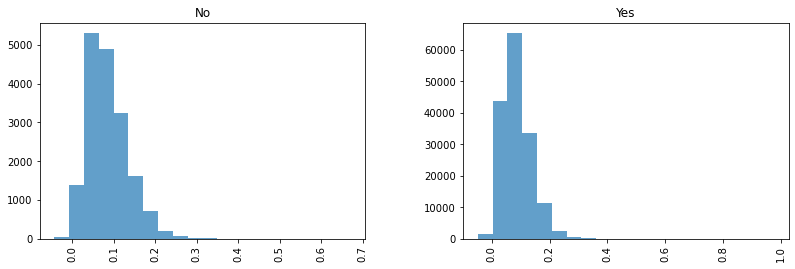

In [34]:
dt_bond['spread'].hist(by=dt_bond['Corporate'], bins=20, alpha=.7, figsize=(13,4))


>From the quantile as well as the histogram we can conclude that the majority of the bonds' spread are around 8%~9%. There's no significant difference in distribution between corporate bonds and sovereign bonds. Both distributions are skewed to right.

---
# b. (10%) Use the previously calculated spread, the yield curve at August 26th, 2020, and the information of the bonds to price them, so they reflect the current market price for the purposes of capital requirement calculations. Compare the original price with August 26th price. What can you say about the risk-free rates and bond prices?

In [35]:
def get_current_price(date='2020-08-26'):

    '''
    An consolidated function to price all the bonds in the dataframe.
    '''

    series = pd.Series.tolist(dt_yc_m.loc[dt_yc_m['Date'] == date])[0][2:]

    PriceAt0826 = [pricing_func2(dt_bond.iloc[rindex]['YearlyRate'],
                                 dt_bond.iloc[rindex]['PaymentPeriod'], dt_bond.iloc[rindex]['FaceValue'],
                                  series, 
                                  dt_bond.iloc[rindex]['CouponsRemaining'], 
                                  dt_bond.iloc[rindex]['spread'], 
                                  dt_bond.iloc[rindex]['AccrualDays']) for rindex in range(0, len(dt_bond))]

    return PriceAt0826

In [36]:
cp = get_current_price('2020-08-26')
dt_bond['PriceAt0826'] = cp
dt_bond['PriceAt0826(%)'] = dt_bond['PriceAt0826'] / dt_bond['FaceValue']  * 100

In [37]:
dt_bond['PriceAt0826(%)'].describe() # A few extreme value detected

count    175680.000000
mean        108.621761
std          43.325802
min          29.810457
25%          86.768059
50%         100.987424
75%         118.913217
max        6618.871723
Name: PriceAt0826(%), dtype: float64

In [38]:
dt_bond.loc[dt_bond['PriceAt0826(%)'] > 500, ['id','PurchaseDate','PriceAtCoupon0(%)','CurrentCoupon','CouponsRemaining','PaymentPeriod','BondsHeld','YearlyRate','FaceValue','Corporate','spread','PriceAt0826(%)']].sort_values(by=['PriceAt0826(%)'], ascending=False) # All bonds with abnormal huge price also have high negative spreads (of good credit rating)

,id,PurchaseDate,PriceAtCoupon0(%),CurrentCoupon,CouponsRemaining,PaymentPeriod,BondsHeld,YearlyRate,FaceValue,Corporate,spread,PriceAt0826(%)
79625,80658,1991-02-07,110.651,29,89,Annually,5,0.058784,142000,Yes,-0.047492,6618.871723
64829,65668,1992-03-03,133.042,28,99,Annually,2084,0.081322,250000,Yes,-0.032676,3596.152720
162698,164813,1992-04-16,76.000,28,96,Annually,1000,0.049247,94000,Yes,-0.030473,1975.987386
44310,44884,1993-01-08,104.013,27,97,Annually,100,0.063780,141000,Yes,-0.025730,1732.480644
108774,110196,1991-03-21,75.883,29,97,Annually,30,0.059071,112000,No,-0.024327,1482.788405
...,...,...,...,...,...,...,...,...,...,...,...,...
19934,20209,1995-12-18,99.054,24,67,Annually,19,0.071610,140000,Yes,-0.008193,507.100385
151832,153806,1993-06-10,87.666,27,54,Annually,10,0.059207,147000,Yes,-0.017004,506.058048
23792,24116,1991-08-20,77.608,29,85,Annually,1250,0.078967,105000,Yes,-0.002127,503.132471
150220,152175,1991-01-07,95.376,29,40,Annually,60,0.090976,125000,Yes,-0.014790,503.010688


<AxesSubplot:ylabel='Frequency'>

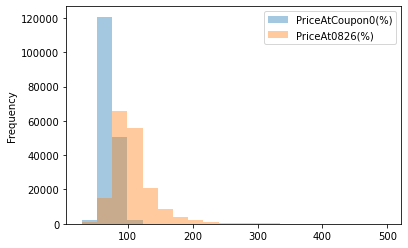

In [39]:
dt_bond.loc[(dt_bond['PriceAt0826(%)']<500) & (dt_bond['PriceAtCoupon0(%)']<500),['PriceAtCoupon0(%)', 'PriceAt0826(%)']].plot.hist(bins = 20, alpha=0.4)

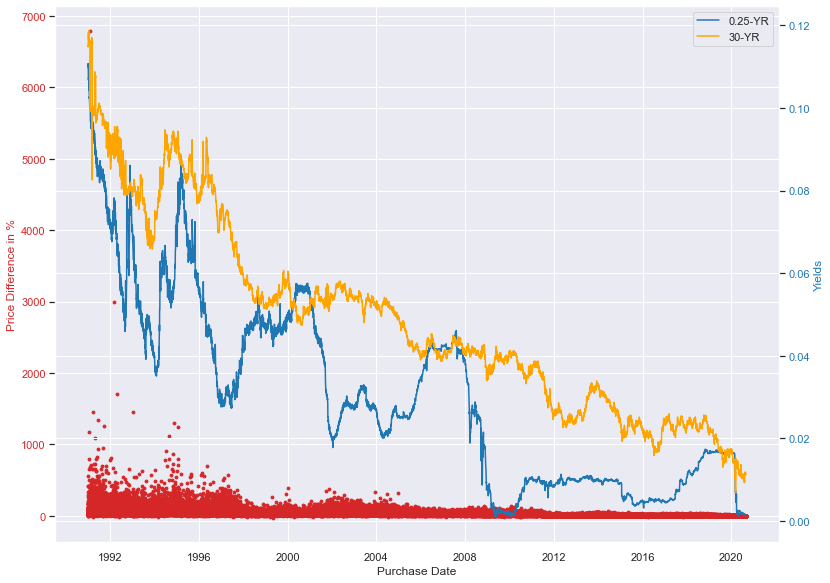

In [616]:
dt_bond['price_diff'] = dt_bond['PriceAt0826(%)'] - dt_bond['PriceAtCoupon0(%)']

fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Purchase Date')
ax1.set_ylabel('Price Difference in %', color=color)
ax1.scatter(dt_bond['PurchaseDate'], dt_bond["price_diff"], color=color, s=8)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()

color = 'tab:blue'
ax2.set_ylabel('Yields', color=color)  
ax2.plot(dt_yc['Date'], dt_yc[' 025YR'], color=color, label='0.25-YR')
ax2.plot(dt_yc['Date'], dt_yc[' 3000YR'], color='orange', label='30-YR')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend()

fig.tight_layout()
plt.savefig('spread_price.png') 

*We can spot that the average risk free rate level has been decreasing from 1990s to 2020s. As can be seen from the line curve, both the 30 year risk-free rate and the annual 120 day risk-free rate have been plunging. A decreasing yield curve over time has created a bull market for the bond market for the last few decades. Following this pattern, the present value of the bonds are increasing, which can be seen through the histogram above, that the distribution of price today has skewed to the right, rendering fatter tails. It can also be seen that the calculated price is always higher than the price at coupon 0. There are more extreme high values thanks to the low risk-free yield curve and the negative spread. There are even 133 bonds that have a current price over 5 times more than it's face value. As a result, the average level is greater for the current price (has a skewed to right distribution).* 

*It can also be seen that as the spread stays constant over time, when the difference between the 120-days curve and the 30-yr curve gets wider, the price difference also widens and vice versa.*

	
	

---
# c. (20%) Calculate the total provisions and capital requirement each operation brings using the prices you just calculated. Report the total provision for the business line and the total capital requirement for that business line.

In [40]:
# Integrate the PD table according to what quantiles bonds's spreads fall into.
dt_bond.loc[dt_bond['spread'] <= dt_bond['spread'].quantile(0.05), 'Rating'] = 'AAA'
dt_bond.loc[(dt_bond['spread'] > dt_bond['spread'].quantile(0.05)) & (dt_bond['spread'] <= dt_bond['spread'].quantile(0.20)), 'Rating'] = 'AA'
dt_bond.loc[(dt_bond['spread'] > dt_bond['spread'].quantile(0.20)) & (dt_bond['spread'] <= dt_bond['spread'].quantile(0.40)), 'Rating'] = 'A'
dt_bond.loc[(dt_bond['spread'] > dt_bond['spread'].quantile(0.40)) & (dt_bond['spread'] <= dt_bond['spread'].quantile(0.60)), 'Rating'] = 'BBB'
dt_bond.loc[(dt_bond['spread'] > dt_bond['spread'].quantile(0.60)) & (dt_bond['spread'] <= dt_bond['spread'].quantile(0.75)), 'Rating'] = 'BB'
dt_bond.loc[(dt_bond['spread'] > dt_bond['spread'].quantile(0.75)) & (dt_bond['spread'] <= dt_bond['spread'].quantile(0.90)), 'Rating'] = 'B'
dt_bond.loc[dt_bond['spread'] > dt_bond['spread'].quantile(0.90), 'Rating'] = 'CCC'
dt_bond.loc[dt_bond['spread'] == 'NaN' , 'Rating'] = 'D'

dt_bond.loc[dt_bond['spread'] <= dt_bond['spread'].quantile(0.05), 'PD'] = 0.001
dt_bond.loc[(dt_bond['spread'] > dt_bond['spread'].quantile(0.05)) & (dt_bond['spread'] <= dt_bond['spread'].quantile(0.20)), 'PD'] = 0.01
dt_bond.loc[(dt_bond['spread'] > dt_bond['spread'].quantile(0.20)) & (dt_bond['spread'] <= dt_bond['spread'].quantile(0.40)), 'PD'] = 0.12
dt_bond.loc[(dt_bond['spread'] > dt_bond['spread'].quantile(0.40)) & (dt_bond['spread'] <= dt_bond['spread'].quantile(0.60)), 'PD'] = 0.36
dt_bond.loc[(dt_bond['spread'] > dt_bond['spread'].quantile(0.60)) & (dt_bond['spread'] <= dt_bond['spread'].quantile(0.75)), 'PD'] = 0.52
dt_bond.loc[(dt_bond['spread'] > dt_bond['spread'].quantile(0.75)) & (dt_bond['spread'] <= dt_bond['spread'].quantile(0.90)), 'PD'] = 0.75
dt_bond.loc[dt_bond['spread'] > dt_bond['spread'].quantile(0.90), 'PD'] = 0.85
dt_bond.loc[dt_bond['spread'] == 'NaN' , 'Rating'] = 1



In [41]:
dt_bond['PD'] = np.where((dt_bond['PD'] <= 0.0005),0.0005,dt_bond['PD'])

>32.4
With the exception of exposures in the sovereign asset class, the PD for each exposure that is used as input into the risk weight formula and the calculation of expected loss must not be less than 0.05%. https://www.bis.org/basel_framework/chapter/CRE/32.htm?inforce=20220101

## Risk-weight functions for corporate, sovereign and bank exposures
[Risk-weighted assets for corporate, sovereign and bank exposures that are not in default](https://www.bis.org/basel_framework/chapter/CRE/31.htm?inforce=20220101)

In [42]:
dt_bond['RemainScheme'] = [np.arange(1, a+1) for a in dt_bond['CouponsRemaining']]
dt_bond['WeightedCF'] = [np.sum(arr) for arr in dt_bond['RemainScheme']]


dt_bond.loc[dt_bond['PaymentPeriod'] == 'Annually', 'EffectiveMaturity'] = (((dt_bond['WeightedCF'] * dt_bond['FaceValue'] * dt_bond['YearlyRate']) + dt_bond['CouponsRemaining'] * dt_bond['FaceValue']) / (dt_bond['FaceValue'] * dt_bond['YearlyRate']* dt_bond['CouponsRemaining'] + dt_bond['FaceValue']))
dt_bond.loc[dt_bond['PaymentPeriod'] == 'Quarterly', 'EffectiveMaturity'] = (((dt_bond['WeightedCF'] * dt_bond['FaceValue'] * dt_bond['YearlyRate'] / 4) + dt_bond['CouponsRemaining'] * dt_bond['FaceValue']) / (dt_bond['FaceValue'] * dt_bond['YearlyRate'] / 4 * dt_bond['CouponsRemaining'] + dt_bond['FaceValue'])) / 4
dt_bond.loc[dt_bond['PaymentPeriod'] == 'Monthly', 'EffectiveMaturity'] = (((dt_bond['WeightedCF'] * dt_bond['FaceValue'] * dt_bond['YearlyRate'] / 12) + dt_bond['CouponsRemaining'] * dt_bond['FaceValue']) / (dt_bond['FaceValue'] * dt_bond['YearlyRate'] / 12 * dt_bond['CouponsRemaining'] + dt_bond['FaceValue'])) / 12

>32.47
For an instrument subject to a determined cash flow schedule, effective maturity M is defined as follows, where CFt denotes the cash flows (principal, interest payments and fees) contractually payable by the borrower in period t:
[effectivematurity](https://www.bis.org/basel_framework/chapter/CRE/32.htm?inforce=20220101#paragraph_CRE_32_20220101_32_47)

In [43]:
dt_bond['Correlation'] = 0.12 * (1 - np.exp(-50 * dt_bond['PD'])) / (1 - np.exp(-50)) + 0.24 * (1 - (1 - np.exp(-50 * dt_bond['PD'])) / (1 - np.exp(-50)))

In [44]:
dt_bond['MaturityAdjustment'] = (0.11852 - 0.05478 * np.log(dt_bond['PD'])) ** 2

In [45]:
dt_bond['CapitalRequirement'] = (0.75 * norm.cdf((norm.ppf(dt_bond['PD'])/np.sqrt(1 - dt_bond['Correlation']) + np.sqrt(dt_bond['Correlation'] / (1 - dt_bond['Correlation'])) * norm.ppf(0.999))) - 0.75 * dt_bond['PD']) * (1 + (dt_bond['EffectiveMaturity'] - 2.5) * dt_bond['MaturityAdjustment']) / (1 - 1.5 * dt_bond['MaturityAdjustment'])

>All subordinated claims on corporates, sovereigns and banks will be assigned a 75% LGD. A subordinated loan is a facility that is expressly subordinated to another facility. At national discretion, supervisors may choose to employ a wider definition of subordination. This might include economic subordination, such as cases where the facility is unsecured and the bulk of the borrower’s assets are used to secure other exposures. https://www.bis.org/basel_framework/chapter/CRE/32.htm?inforce=20220101


>New! Re: LGD under Foundation Approach
>Cristian Bravo Roman (cbravoro)(Oct 1, 2020 9:42 AM)- Read by: 2
>Mark as ReadReply to This Message Reply
>Good question. Assume all bonds are subordinated for the purposes of the coursework.


In [46]:
dt_bond['CreditRequirementCharge'] = dt_bond['BondsHeld'] * dt_bond['FaceValue'] * dt_bond['PriceAt0826(%)'] / 100 * dt_bond['CapitalRequirement']

In [47]:
dt_bond['RWA'] = dt_bond['CreditRequirementCharge'] * 12.5

In [48]:
dt_bond['EL'] = dt_bond['BondsHeld'] * dt_bond['FaceValue'] * dt_bond['PriceAt0826(%)'] / 100 * 0.75 * dt_bond['PD']

In [49]:
pd.options.display.float_format = '{:.3f}'.format
dt_bond[['id','PurchaseDate','PriceAtCoupon0(%)','YearlyRate','FaceValue','Corporate','spread','PriceAt0826(%)','PD','EffectiveMaturity','Correlation','MaturityAdjustment','CapitalRequirement','CreditRequirementCharge','RWA','EL']].head()

,id,PurchaseDate,PriceAtCoupon0(%),YearlyRate,FaceValue,Corporate,spread,PriceAt0826(%),PD,EffectiveMaturity,Correlation,MaturityAdjustment,CapitalRequirement,CreditRequirementCharge,RWA,EL
0,1,1994-09-07,62.489,0.135,157000,Yes,0.126,100.067,0.750,16.568,0.120,0.018,0.211,862784.378,10784804.721,2297669.337
1,2,1994-09-07,97.044,0.161,125000,Yes,0.076,181.672,0.360,17.569,0.120,0.030,0.477,974915.331,12186441.637,551828.427
2,3,1994-09-07,75.515,0.191,99000,Yes,0.130,123.643,0.750,11.946,0.120,0.018,0.197,241361.698,3017021.219,688536.923
3,4,1994-09-07,69.743,0.092,103000,Yes,0.033,188.704,0.010,26.226,0.193,0.137,0.525,60158479.564,751980994.546,860063.889
4,5,1994-09-07,64.350,0.122,90000,Yes,0.080,125.985,0.360,19.143,0.120,0.030,0.493,3966325.512,49579068.894,2173626.696


In [50]:
dt_bond.to_csv('result2.csv', index=False)

In [51]:
dt_bond.groupby(['Corporate'])['EL'].sum()

Corporate
No     125295536116.988
Yes   1098391289466.045
Name: EL, dtype: float64

In [52]:
dt_bond.groupby(['Corporate'])['CreditRequirementCharge'].sum()

Corporate
No     247637542731.274
Yes   2186286945113.464
Name: CreditRequirementCharge, dtype: float64

In [53]:
dt_bond.groupby(['Corporate'])['RWA'].sum()

Corporate
No     3095469284140.941
Yes   27328586813917.664
Name: RWA, dtype: float64

In [54]:
dt_bond.groupby(['Corporate'])['RWA'].sum() * 11.5 / 100 - dt_bond.groupby(['Corporate'])['CreditRequirementCharge'].sum() # capital adequacy requirement of 11.5%

Corporate
No    108341424944.934
Yes   956500538487.067
dtype: float64

| Operation Line | EL | CreditRequirementCharge | RWA | Capital Requirement Shortfall |
| ----------- | ----------- | ----------- |
| Corporate | $1,098,391,289,466.045 | $2,186,286,945,113.464 | $27,328,586,813,917.664 | $956,500,538,487.067 |
| Sovereign | $125,295,536,116.988 | $247,637,542,731.274 | $3,095,469,284,140.941 | $108,341,424,944.934 |